In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
from sklearn import ensemble
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score
import seaborn as sns
import statsmodels.formula.api as smf
import mapclassify
import matplotlib.pyplot as plt 
from matplotlib_scalebar.scalebar import ScaleBar
import contextily as cx
import colorcet as cc
import os
import libpysal

from matplotlib import pyplot as plt
from matplotlib import style
style.use("ggplot")
import geopandas as gpd
from shapely.geometry import Point
from shapely.geometry import Polygon
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import ListedColormap
from utils.plot_utils import find_highest_values

In [ ]:
directory = 'D:\...\TOC_features4'

# Get list of files in the directory
files = [os.path.splitext(f)[0] for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]


modified_names = ['Actual Evapotranspiration', 'Analytical Hillshading', 'Aspect', 'BulkDensity', 'Channel Network Base Level', 
 'Channel Network Distance', 'Clay', 'Closed Depressions', 'Convergence Index', 'Climate Water Deficit', 
 'HLS_bi', 'HLS_blue', 'HLS_evi', 'HLS_gemi', 'HLS_gli', 'HLS_green', 'HLS_ndvi', 'HLS_nir', 
 'HLS_red', 'HLS_swir1', 'HLS_swir2', 'LS-Factor', 'MODIS tree', 'NPP_Terra', 
 'PALSAR_Forest', 'Pdsi', 'Reference Evapotranspiration', 'pH', 'Plan Curvature', 'Precipitation Accumulation', 'Profile Curvature', 
 'Relative Slope Position', 'Runoff', 'Slope', 'Soil Moisture', 'Surface Radiation', 'Elevation', 'Taxonomy', 
 'Texture', 'Minimum Temperature', 'Maximum Temperature', 'Topographic Wetness Index', 'Total Catchment Area', 
 'Valley Depth', 'Vapor Pressure Deficit', 'Vapor Pressure', 'Wind Speed', 'Watercontent']

print(len(modified_names))


short_names = ['aet', 'An Hill', 'Aspect', 'BulkDensity', 'Ch Net Ba Le', 
 'Ch Net Dis', 'Clay', 'Cl De', 'Conv Ind', 'def', 
 'HLS bi', 'HLS blue', 'HLS evi', 'HLS gemi', 'HLS gli', 'HLS green', 'HLS ndvi', 'HLS nir', 
 'HLS red', 'HLS swir1', 'HLS swir2', 'LS Factor', 'MODIS tree', 'NPP', 
 'PALSAR Forest', 'Pdsi', 'pet', 'pH', 'Pl Curv', 'pr', 'Prof Cur', 
 'Rel Slope Pos', 'Runoff', 'Slope', 'Soil Mo', 'Srad', 'Elevation', 'Taxonomy', 
 'Texture', 'tmmn', 'tmmx', 'TWI', 'TCA', 
 'Valley Depth', 'vap', 'vpd', 'vs', 'Watercontent']



an_dict = {
    'aet': 'Prim(Clim)', 'An Hill': 'Topo', 'Aspect': 'Topo','BulkDensity': 'Soil',
    'Ch Net Ba Le': 'Topo','Ch Net Dis': 'Topo','Clay': 'Soil','Cl De': 'Topo',
    'Conv Ind': 'Topo','def': 'Prim(Clim)','HLS bi': 'RS','HLS blue': 'RS',
    'HLS evi': 'Veg','HLS gemi': 'Veg','HLS gli': 'Veg','HLS green': 'RS',
    'HLS ndvi': 'Veg','HLS nir': 'RS','HLS red': 'RS','HLS swir1': 'RS',
    'HLS swir2': 'RS','LS Factor': 'Topo','MODIS tree': 'Veg',
    'NPP': 'Veg','PALSAR Forest': 'Veg','Pdsi': 'Prim(Clim)',
    'pet': 'Prim(Clim)','pH': 'Soil','Pl Curv': 'Topo','pr': 'Sec(Clim)',
    'Prof Cur': 'Topo','Rel Slope Pos': 'Topo',
    'Runoff': 'Prim(Clim)','Slope': 'Topo',
    'Soil Mo': 'Soil','Srad': 'Sec(Clim)','Elevation': 'Topo',
    'Taxonomy': 'Soil','Texture': 'Soil','tmmn': 'Sec(Clim)',
    'tmmx': 'Sec(Clim)','TWI': 'Topo','TCA': 'Topo',
    'Valley Depth': 'Topo','vap': 'Prim(Clim)','vpd': 'Sec(Clim)',
    'vs': 'Sec(Clim)','Watercontent': 'Soil'
}

clrplt_3 = ['#CBB2AB', '#4B3937','#7F9936', '#1E552D','#C76467']


# category_colors = {
#     'Topo': '#D2B48C',    # Light tan or beige color, representing remote sensing features
#     'Sec(Clim)': '#9BBBD4',   
#     'Prim(Clim)': '#567894',  
#     'Veg': '#1E552D',  # Dark green color, representing primary (climate) features
#     'RS': '#7F9936',   # Olive green color, representing secondary (climate) features
#     'Soil': '#4B3937'   # Dark brown color, representing soil-related features
# }

# This is the bright version of the above colors
category_colors = {
    'Topo': '#FFE0B6',    # Light tan or beige color, representing remote sensing features
    'Sec(Clim)': '#B4E3FF',   
    'Prim(Clim)': '#6E9DC3',  
    'Veg': '#26873E',  # Dark green color, representing primary (climate) features
    'RS': '#7F9936',   # Olive green color, representing secondary (climate) features
    'Soil': '#6E4C49'   # Dark brown color, representing soil-related features
}
colored_an_dict = {key: category_colors[value] for key, value in an_dict.items()}



48


In [3]:
# Load the boundary of Germany
germany_boundary = gpd.read_file("D:\ArcGIS\Projects\MyProject\Gadm40\gadm40_DEU_0.shp")  # Provide the path to your shapefile
epsg = 3035

In [4]:
# # Define the path to the directory containing the CSV files
# directory_path = 'C:\\Users\\nkakhani\\CXplain\\random_samples_landcover'

# # List to store individual DataFrames
# dfs = []

# # Iterate over all files in the directory
# for filename in os.listdir(directory_path):
#     if filename.endswith('.csv'):
#         file_path = os.path.join(directory_path, filename)
#         df = pd.read_csv(file_path)
#         dfs.append(df)

# # Concatenate all DataFrames in the list
# concatenated_df = pd.concat(dfs, ignore_index=True)
# concatenated_df.head()

# ###############################################################################
# # Create a GeoDataFrame by converting 'x' and 'y' into Shapely Point geometries
# geometry = [Point(xy) for xy in zip(concatenated_df['long'], concatenated_df['lat'])]

# # Create the GeoDataFrame with the correct CRS
# gdf = gpd.GeoDataFrame(concatenated_df, geometry=geometry, crs='EPSG:4326')

# # Clip points outside of Germany
# gdf = gpd.clip(gdf, germany_boundary)

# # Reproject to the desired EPSG (e.g., epsg of the shapefile)
# gdf = gdf.to_crs(epsg=epsg)
# # # Save the concatenated DataFrame to a new CSV file
# # output_path = 'path/to/save/aggregated_file.csv'
# # concatenated_df.to_csv(output_path, index=False)

# # print(f"Aggregated CSV file saved to {output_path}")


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LightSource
import rasterio
import geopandas as gpd
from rasterio.mask import mask
import tempfile
import os

# Function to create hillshade
def hillshade(elevation, azimuth=315, angle_altitude=45):
    ls = LightSource(azdeg=azimuth, altdeg=angle_altitude)
    shaded = ls.hillshade(elevation, vert_exag=1, dx=1, dy=1)
    return shaded


# Ensure the shapefile is in the target CRS
target_crs = 'EPSG:3035'
if germany_boundary.crs != target_crs:
    germany_boundary = germany_boundary.to_crs(target_crs)

# Read elevation data (DEM) using rasterio
original_dem_path = 'D:/.../TOC_features4/SRTM3_Ger.tif'


with rasterio.open(original_dem_path) as dem_src:
    if dem_src.crs != target_crs:
        # Reproject the DEM to the target CRS
        with tempfile.NamedTemporaryFile(suffix='.tif', delete=False) as tmpfile:
            reprojected_dem_path = tmpfile.name
        
        transform, width, height = rasterio.warp.calculate_default_transform(
            dem_src.crs, target_crs, dem_src.width, dem_src.height, *dem_src.bounds)
        kwargs = dem_src.meta.copy()
        kwargs.update({
            'crs': target_crs,
            'transform': transform,
            'width': width,
            'height': height
        })
        
        with rasterio.open(reprojected_dem_path, 'w', **kwargs) as dst:
            for i in range(1, dem_src.count + 1):
                rasterio.warp.reproject(
                    source=rasterio.band(dem_src, i),
                    destination=rasterio.band(dst, i),
                    src_transform=dem_src.transform,
                    src_crs=dem_src.crs,
                    dst_transform=transform,
                    dst_crs=target_crs,
                    resampling=rasterio.warp.Resampling.nearest)
        
        dem_path = reprojected_dem_path
    else:
        dem_path = original_dem_path

# Read the (possibly reprojected) DEM
with rasterio.open(dem_path) as dem_src:
    elevation = dem_src.read(1)
    dem_transform = dem_src.transform

# Convert GeoDataFrame to GeoJSON-like dictionary for rasterio
shapes = [feature["geometry"] for feature in germany_boundary.__geo_interface__["features"]]

# Clip the DEM using the Germany boundary
with rasterio.open(dem_path) as src:
    elevation_clipped, elevation_transform = mask(src, shapes, crop=True)
    elevation_clipped = elevation_clipped[0]  # Extract the first band

# Create hillshade from clipped elevation data
hillshade_image = hillshade(elevation_clipped)


# # Create the plot
# fig, ax = plt.subplots(figsize=(10, 10))

# # Overlay clipped hillshade as a background image
# ax.imshow(hillshade_image, cmap='gray', alpha=0.5, extent=(elevation_transform[2], elevation_transform[2] + elevation_transform[0] * elevation_clipped.shape[1],
#                                                             elevation_transform[5] + elevation_transform[4] * elevation_clipped.shape[0], elevation_transform[5]))


# Clean up temporary file if it was created
if 'reprojected_dem_path' in locals():
    os.remove(reprojected_dem_path)


# load data

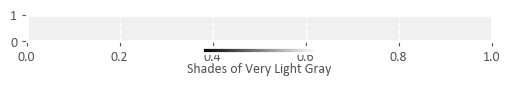

In [6]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import colorsys

# Load the boundary of Germany
germany_boundary = gpd.read_file("D:\ArcGIS\Projects\MyProject\Gadm40\gadm40_DEU_0.shp")  # Provide the path to your shapefile
epsg = 3035

# Define the number of shades
num_shades = 10

# Define the hue and saturation for very light gray
hue = 0.667  # Hue for gray color (blue)
saturation = 0.0  # Saturation for gray color (0 for grayscale)

# Define the lightness range for very light gray
start_lightness = 0.1  # Starting lightness
end_lightness = 1.0     # Ending lightness (pure white)

# Generate shades of very light gray
shades = np.linspace(start_lightness, end_lightness, num_shades)

# Create a colormap from the shades of gray
gray_cmap = LinearSegmentedColormap.from_list("CustomGray", [(x, x, x) for x in shades], N=num_shades)

# Plot a color swatch with the defined colormap
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

# Create a color swatch
cmap_colorbar = LinearSegmentedColormap.from_list("CustomGray", [(x, x, x) for x in np.linspace(0, 1, num_shades)])
cbar = plt.colorbar(plt.cm.ScalarMappable(cmap=cmap_colorbar), ax=ax, orientation='horizontal')
cbar.set_label('Shades of Very Light Gray')
cbar.set_ticks([])
cbar.set_ticklabels([])

plt.show()

In [7]:

# # file_names = ['Att_MLP_ZeroMasking_NN.csv', 'Att_MLP_ZeroMasking_DeepForest.csv',
# #               'Att_MLP_ZeroMasking_Ridge.csv', 'Att_MLP_ZeroMasking_GB.csv', 
# #               'Att_MLP_ZeroMasking_RF.csv']


# file_names = [ 'Att_MLP_ZeroMasking_DeepForest.csv',
#               'Att_MLP_ZeroMasking_RF.csv']

# for file in file_names:

#     # Split the file name by underscores
#     parts = file.split('_')

#     # Extract the last part, which represents "NN"
#     ML = parts[-1].split('.')[0]
#     print(ML)
    
#     ###############################################################################
#     # Read the attributions of the features##################
#     attributions = pd.read_csv(file)
#     attributions.head()

#     # Rename the columns using the rename() method
#     df = attributions.iloc[:,:-2]
#     df.columns = an_dict

#     result_df = find_highest_values(df)

#     # Create a new column with the grouped categories
#     result_df['Grouped_Column'] = result_df['Corresponding_Column'].map(an_dict)

#     # Concatenate the last two columns from df to result_df
#     result_df_with_xy = pd.concat([result_df, attributions.iloc[:, -2:]], axis=1)
    
#     ###############################################################################
#     # Create a GeoDataFrame by converting 'x' and 'y' into Shapely Point geometries
#     geometry = [Point(xy) for xy in zip(result_df_with_xy['X'], result_df_with_xy['Y'])]

#     # Create the GeoDataFrame with the correct CRS
#     gdf = gpd.GeoDataFrame(result_df_with_xy, geometry=geometry, crs='EPSG:4326')

#     # Clip points outside of Germany
#     gdf = gpd.clip(gdf, germany_boundary)

#     # Reproject to the desired EPSG (e.g., epsg of the shapefile)
#     gdf = gdf.to_crs(epsg=epsg)


#   ###############################################################################
#     # Filter GeoDataFrame for the classes you want to include
#     gdf = gdf[gdf['Grouped_Column'].isin(['RS'])]

#     # Ensure all classes in the GeoDataFrame are covered by the class_colors dictionary
#     unique_classes = gdf['Grouped_Column'].unique()

#     # Create a list of colors corresponding to the unique classes in the order they appear in unique_classes
#     colors = [category_colors[cls] for cls in sorted(unique_classes)]
#    # colors = [category_colors[cls] for cls in sorted(category_colors.keys())]

#     custom_cmap = ListedColormap(colors)

#     ###############################################################################
#     fig = plt.figure(figsize=(20, 16))
#     plt.rcParams['axes.grid'] = False  # Show gridlines
#     plt.title(f'{ML}', fontsize = 40, loc = 'center')
    
#     ax = plt.gca()
    

#     # Overlay clipped hillshade as a background image
#     ax.imshow(hillshade_image, cmap = gray_cmap, alpha=1, \
#               extent=(elevation_transform[2], elevation_transform[2] + elevation_transform[0] * elevation_clipped.shape[1],
#                       elevation_transform[5] + elevation_transform[4] * elevation_clipped.shape[0], elevation_transform[5]))
    
    
#     gdf.plot(column='Grouped_Column', categorical = True, 
#             alpha = 1, markersize = 2,\
#             cmap = custom_cmap, legend = False, ax = ax,\
#                     legend_kwds={
#                                  'loc': 'center left', 
#                                  'bbox_to_anchor':(1,0.5)})

# #     # Set the fontsize of the legend texts
# #     legend = ax.get_legend()
    
    
# #     for text in legend.texts:
# #           text.set_fontsize(32)

#     # cx.add_basemap(ax, source=cx.providers.Esri.WorldTerrain, crs = epsg)
#     # cx.add_basemap(ax, source=cx.providers.Stamen.TonerBackground, crs = "EPSG:32632")

#     # Set the fontsize of the axis labels
#     ax.tick_params(axis='both', which='major', labelsize = 32)
    
#     # Set label for x-axis
#     ax.set_xlabel('Longitude', fontsize=32)

#     # Set label for y-axis
#     ax.set_ylabel('Latitude', fontsize=32)

#     #northArrow
#     x, y, arrow_length = 0.9, 0.95, 0.05

#     ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
#             arrowprops=dict(facecolor='black', width=5, headwidth=15),
#             ha='center', va='center', fontsize = 32,
#             xycoords=ax.transAxes)

#     ax.add_artist(ScaleBar(1))


#     # Adjust layout to make sure everything fits properly
#     plt.tight_layout()
    
#     plt.savefig( f'{ML}_major_feature_RS.png', facecolor='white', bbox_inches='tight', dpi = 100)
#     plt.show()


In [8]:
# import geopandas as gpd
# import matplotlib.pyplot as plt

# # Assuming gdf is your GeoPandas DataFrame
# # gdf = gpd.read_file('path/to/your/geopandas/dataframe')

# # Define the color and name mapping based on the landcover_class
# color_mapping = {
#     10: ('#006400', 'Tree cover'),
#     20: ('#ffbb22', 'Shrubland'),
#     30: ('#ffff4c', 'Grassland'),
#     40: ('#f096ff', 'Cropland'),
#     50: ('#fa0000', 'Built-up'),
#     60: ('#b4b4b4', 'Bare / sparse vegetation'),
#     70: ('#f0f0f0', 'Snow and ice'),
#     80: ('#0064c8', 'Permanent water bodies'),
#     90: ('#0096a0', 'Herbaceous wetland'),
#     95: ('#00cf75', 'Mangroves'),
#     100: ('#fae6a0', 'Moss and lichen')
# }


# # Filter out rows with landcover_class for Snow and ice (70), Permanent water bodies (80), and Built-up (50)
# gdf = gdf[~gdf['landcover_class'].isin([50, 70, 80])]

# plt.rcParams['axes.grid'] = False  # Show gridlines

# # Apply the color mapping to a new column in the GeoDataFrame
# gdf['color'] = gdf['landcover_class'].map(lambda x: color_mapping[x][0])

# # Plot the GeoDataFrame using the color mapping
# fig, ax = plt.subplots(1, 1, figsize=(20, 18))
# plt.rcParams['axes.grid'] = False  # Show gridlines



# # Overlay clipped hillshade as a background image
# ax.imshow(hillshade_image, cmap = gray_cmap, alpha=0.7, \
#               extent=(elevation_transform[2], elevation_transform[2] + elevation_transform[0] * elevation_clipped.shape[1],
#                       elevation_transform[5] + elevation_transform[4] * elevation_clipped.shape[0], elevation_transform[5]))


# gdf.plot(ax=ax, color=gdf['color'], legend=False, markersize = 2.5, alpha = 0.8)

# # # Create a custom legend
# # import matplotlib.patches as mpatches
# # legend_handles = [mpatches.Patch(color=color_mapping[key][0], label=color_mapping[key][1]) 
# #                   for key in color_mapping if key not in [50, 70, 80]]

# # # legend = ax.legend(handles=legend_handles, title='Landcover Class', loc='lower right')
# # # plt.setp(legend.get_title(), fontweight='bold', fontsize = 14)

# # ncol = (len(legend_handles) + 1) // 2  # Adjust this as needed
# # legend = ax.legend(handles=legend_handles, title='Landcover Class', loc='lower right', ncol=ncol)
# # plt.setp(legend.get_title(), fontweight='bold')

# plt.title('Landcover Map', fontsize = 40, loc = 'center')


# # Set the fontsize of the axis labels
# ax.tick_params(axis='both', which='major', labelsize = 32)

# # Set label for x-axis
# ax.set_xlabel('Longitude', fontsize = 32)

# # Set label for y-axis
# ax.set_ylabel('Latitude', fontsize = 32)


# #northArrow
# x, y, arrow_length = 0.9, 0.97, 0.07

# ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
#             arrowprops=dict(facecolor='black', width=5, headwidth=15),
#             ha='center', va='center', fontsize=24,
#             xycoords=ax.transAxes)

# ax.add_artist(ScaleBar(1))
# plt.rcParams['axes.grid'] = False  # Show gridlines

# # Adjust layout to make sure everything fits properly
# plt.tight_layout()


# # Save the figure to the specified file path
# # plt.savefig('LULC.png', dpi=100, pad_inches=0.2, bbox_inches='tight')
# plt.show()



In [9]:
# Create a muted version of the 'cubehelix' colormap
cubehelix_colors = plt.cm.gist_earth_r(np.linspace(0, 1, 256))
muted_colors = cubehelix_colors * 1  # reduce brightness

# Create a new colormap with the muted colors
muted_cubehelix_cmap = LinearSegmentedColormap.from_list('muted_cubehelix', muted_colors)

### SOC maps

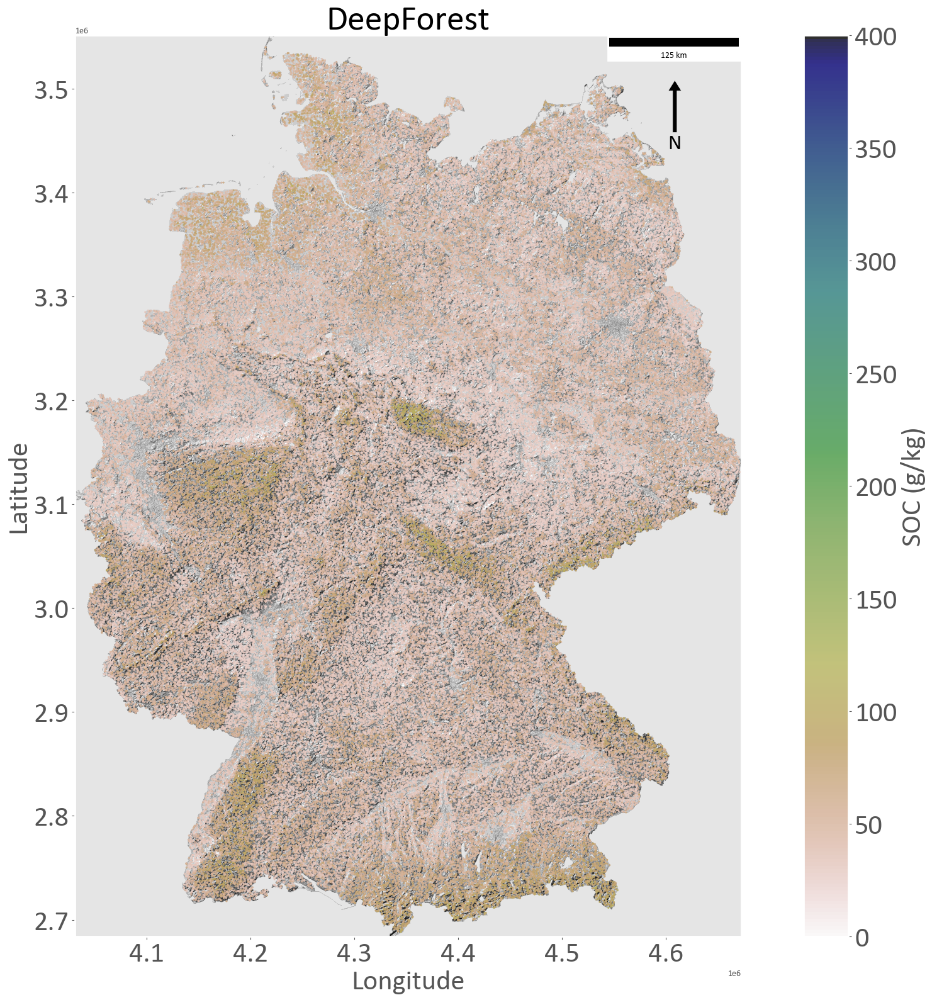

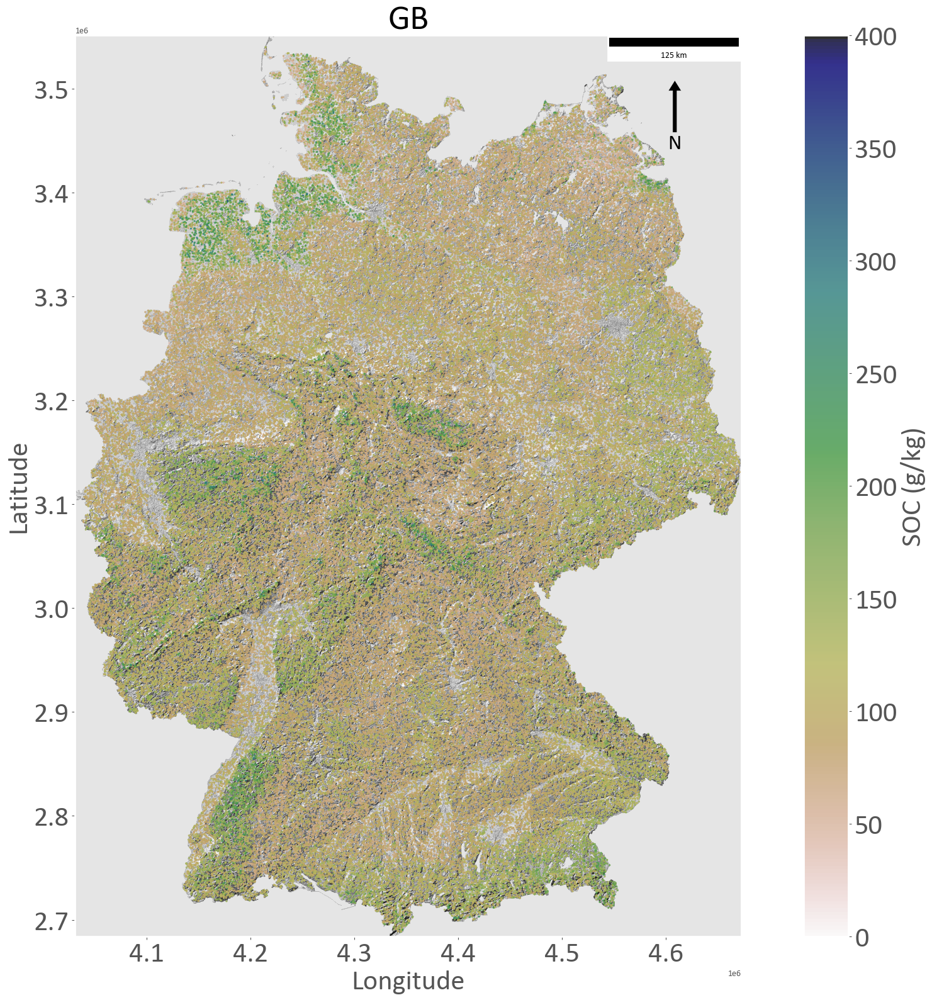

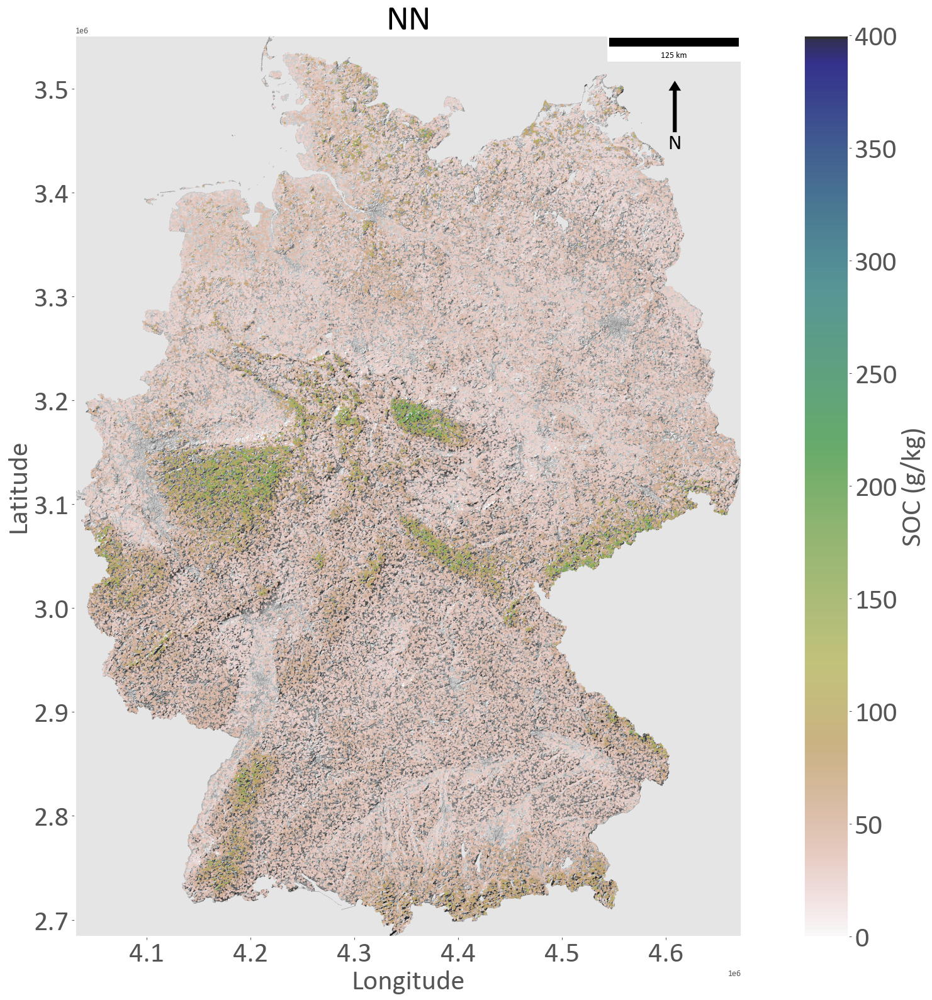

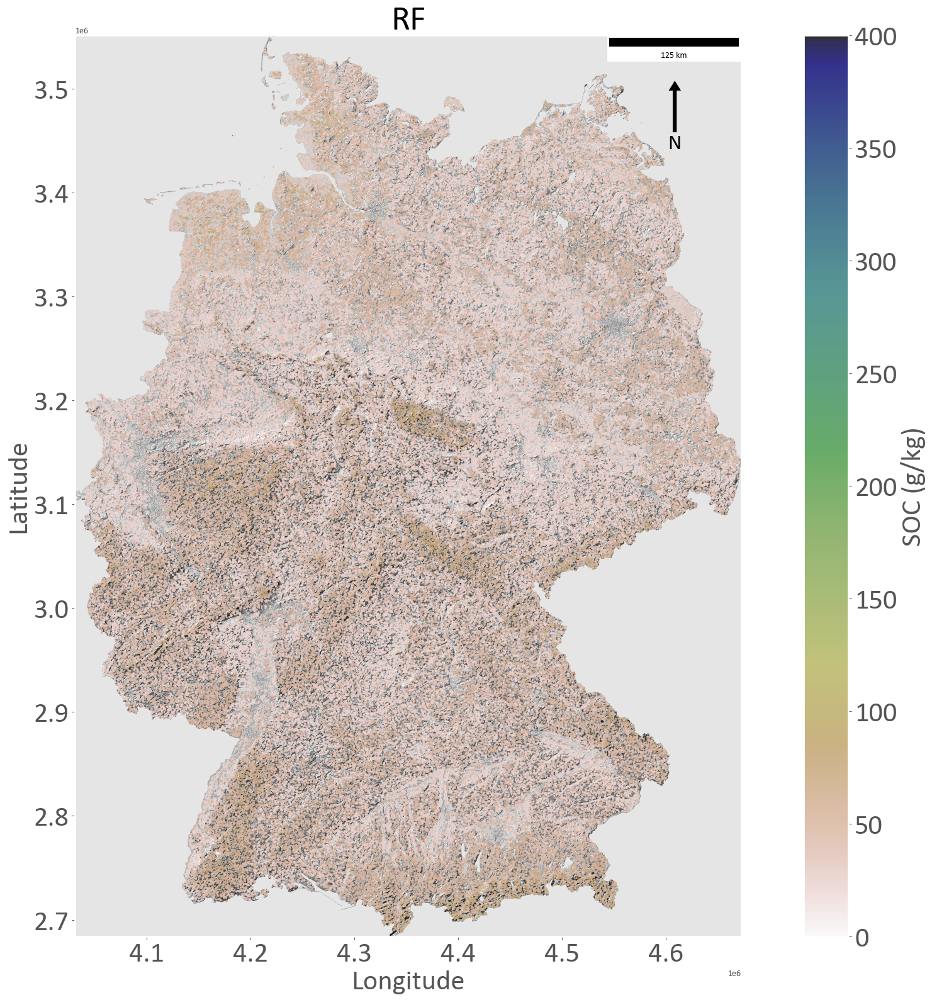

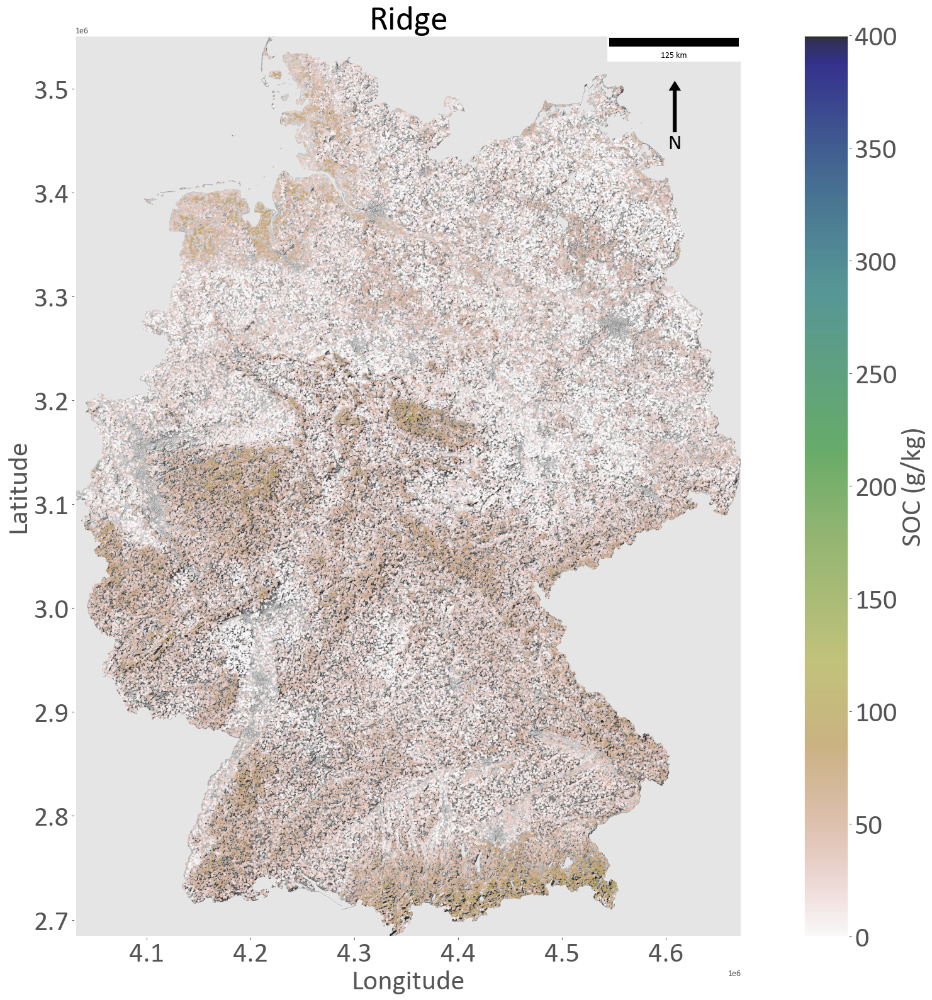

In [11]:
# List of your dataframes
file_names = ['SOC_DeepForest.csv', 'SOC_GB.csv', 'SOC_NN.csv', 'SOC_RF.csv', 'SOC_Ridge.csv']

for file in file_names:
  
  plt.rcParams['axes.grid'] = False  # Show gridlines
   
  #  Split the file name by underscores
  parts = file.split('_')
   
  SOC = pd.read_csv(file)
  # SOC.columns = modified_names
  
  # Create a GeoDataFrame by converting 'x' and 'y' into Shapely Point geometries
  geometry = [Point(xy) for xy in zip(SOC['X'], SOC['Y'])]

  # Create the GeoDataFrame with the correct CRS
  SOC_gdf = gpd.GeoDataFrame(SOC, geometry=geometry, crs='EPSG:4326')

  # Clip points outside of Germany
  SOC_gdf = gpd.clip(SOC_gdf, germany_boundary)

  SOC_gdf = SOC_gdf.to_crs(epsg=epsg)

  fig = plt.figure(figsize=(20, 16))

  name = parts[1].replace('.csv', '')

  plt.title(name, fontsize = 40, loc = 'center')
  ax = plt.gca()
  plt.rcParams['axes.grid'] = False  # Show gridlines


  # Overlay clipped hillshade as a background image
  ax.imshow(hillshade_image, cmap = gray_cmap, alpha=1, \
              extent=(elevation_transform[2], elevation_transform[2] + elevation_transform[0] * elevation_clipped.shape[1],
                      elevation_transform[5] + elevation_transform[4] * elevation_clipped.shape[0], elevation_transform[5]))
    
  
  # Define the minimum and maximum values for the legend
  soc_min = 0
  soc_max = 400  # Adjust this value according to your data range


  plot = SOC_gdf.plot(column='SOC',
                    alpha = 0.8, markersize = 3,\
                    cmap= muted_cubehelix_cmap, legend=False, ax = ax,\
                    legend_kwds={ 
                          'label': "SOC (g/kg)",
                          'orientation': "vertical"},
                    vmin = soc_min,
                    vmax = soc_max)  # Set the minimum value of SOC
                          
  
  # # Get the colorbar associated with the plot
  # colorbar = plot.get_figure().get_axes()[1]

  # # Set font size for colorbar
  # colorbar.tick_params(labelsize= 32)

  # Customize the colorbar to use the custom boundaries and set the font size
  cbar = plt.colorbar(plot.collections[0], ax=ax, orientation="vertical")
  cbar.set_label("SOC (g/kg)")
  cbar.ax.yaxis.label.set_size(32)  # Set the font size of the colorbar label
  cbar.ax.tick_params(labelsize=32)  # Set the font size of the colorbar ticks

  # cx.add_basemap(ax, source=cx.providers.Esri.WorldTerrain, crs = "EPSG:3035")
 # cx.add_basemap(ax, source=cx.providers.Stamen.TonerBackground, crs = "EPSG:32632")

  # Set the fontsize of the axis labels
  ax.tick_params(axis='both', which='major', labelsize = 32)

  # Set label for x-axis
  ax.set_xlabel('Longitude', fontsize = 32)

  # Set label for y-axis
  ax.set_ylabel('Latitude', fontsize = 32)

  #northArrow
  x, y, arrow_length = 0.9, 0.95, 0.07

  ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=24,
            xycoords=ax.transAxes)

  ax.add_artist(ScaleBar(1))

  # Adjust layout to make sure everything fits properly
  plt.tight_layout()

  plt.savefig('SOC_'+f'{name}_topo_fixedrange.png', facecolor='white', bbox_inches='tight', dpi = 100)
  plt.show()


In [ ]:
# List of your dataframes
file_names = ['input_features.csv']

for file in file_names:
   
  df = pd.read_csv (file)
  SOC = y = df.iloc[:,0:3]

#   print(SOC.min())
#   print(SOC.max())
#   print(SOC.mean())
#   print(SOC.std())
#   # Calculate Q1 and Q3
#   print(SOC.quantile(0.25))
#   print(SOC.quantile(0.50))
#   print(SOC.quantile(0.75))

#   break
  # SOC.columns = modified_names
  
  # Create a GeoDataFrame by converting 'x' and 'y' into Shapely Point geometries
  geometry = [Point(xy) for xy in zip(SOC['X'], SOC['Y'])]

  # Create the GeoDataFrame with the correct CRS
  SOC_gdf = gpd.GeoDataFrame(SOC, geometry=geometry, crs='EPSG:4326')

  # Clip points outside of Germany
  SOC_gdf = gpd.clip(SOC_gdf, germany_boundary)

  SOC_gdf = SOC_gdf.to_crs(epsg=epsg)

  fig = plt.figure(figsize=(20, 16))

  name = 'GT'

  plt.title(name, fontsize = 40, loc = 'center')
  plt.rcParams['axes.grid'] = False  # Show gridlines
  ax = plt.gca()


  # Overlay clipped hillshade as a background image
  ax.imshow(hillshade_image, cmap = 'gray', alpha=0.5, \
              extent=(elevation_transform[2], elevation_transform[2] + elevation_transform[0] * elevation_clipped.shape[1],
                      elevation_transform[5] + elevation_transform[4] * elevation_clipped.shape[0], elevation_transform[5]))
    
  
  # Define the minimum and maximum values for the legend
  soc_min = 0
  soc_max = 300  # Adjust this value according to your data range


  plot = SOC_gdf.plot(column='OC',
                    alpha = 1, markersize = 50, edgecolor = 'gray',\
                    cmap= 'brg_r', legend=False, ax = ax,\
                    legend_kwds={ 
                          'label': "SOC (g/kg)",
                          'orientation': "vertical"},
                    vmin = soc_min)  # Set the minimum value of SOC
                          
  
  # # Get the colorbar associated with the plot
  # colorbar = plot.get_figure().get_axes()[1]

  # # Set font size for colorbar
  # colorbar.tick_params(labelsize= 32)

  # Customize the colorbar to use the custom boundaries and set the font size
  cbar = plt.colorbar(plot.collections[0], ax=ax, orientation="vertical")
  cbar.set_label("SOC (g/kg)")
  cbar.ax.yaxis.label.set_size(32)  # Set the font size of the colorbar label
  cbar.ax.tick_params(labelsize=32)  # Set the font size of the colorbar ticks

  # cx.add_basemap(ax, source=cx.providers.Esri.WorldTerrain, crs = "EPSG:3035")
 # cx.add_basemap(ax, source=cx.providers.Stamen.TonerBackground, crs = "EPSG:32632")

  # Set the fontsize of the axis labels
  ax.tick_params(axis='both', which='major', labelsize = 32)

  # Set label for x-axis
  ax.set_xlabel('Longitude', fontsize = 32)

  # Set label for y-axis
  ax.set_ylabel('Latitude', fontsize = 32)

  #northArrow
  x, y, arrow_length = 0.9, 0.95, 0.07

  ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=24,
            xycoords=ax.transAxes)

  ax.add_artist(ScaleBar(1))

  # Adjust layout to make sure everything fits properly
  plt.tight_layout()

  # plt.savefig('SOC_'+f'{name}_topo_fixedrange.png', facecolor='white', bbox_inches='tight', dpi = 100)
  plt.show()



In [ ]:
df = pd.read_csv (file)
SOC = df.iloc[:,0:3]
# SOC = np.log(SOC + 1)

# def plot_histogram_and_kde(df, column_name):
#     # Create a figure and axis
#     fig, ax = plt.subplots(figsize=(10, 6))

#     # Plot histogram with KDE
#     sns.histplot(df[column_name], bins=100, kde=True, color='green', alpha = 0.3, ax=ax)

#     # Set background color
#     ax.set_facecolor('#F0F0F0')

#     # Make the borders of subplots bold
#     for spine in ax.spines.values():
#         spine.set_linewidth(1)  # Set the border linewidth to 2

#     # Reduce the size of numbers on the axes
#     ax.tick_params(axis='both', which='both', labelsize= 16, pad=3)

#     ax.set_xlabel("SOC values (g/Kg)",  fontsize = 32)
#     ax.set_ylabel("Frequency/Density",  fontsize = 32)

#     # Add horizontal and vertical gridlines
#     ax.grid(axis='both', linestyle='--', linewidth=1, color='white')

#     # Save the figure to the specified file path
#     plt.savefig('hist_kde.png', dpi=200, pad_inches=0.2, bbox_inches='tight')

#     # Show the plot
#     plt.show()


import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def plot_histogram_and_kde(df, column_name):
    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot histogram with conditional coloring
    bins = 87
    data = df[column_name]
    hist_data = plt.hist(data, bins=bins, alpha=0)
    bin_edges = hist_data[1]

    for i in range(len(bin_edges) - 1):
        bin_color = 'green' if bin_edges[i] < 100 else 'red'
        ax.bar(bin_edges[i], hist_data[0][i], width=bin_edges[i+1] - bin_edges[i], color=bin_color, alpha=0.3, edgecolor='black')

    # Plot KDE
    # sns.kdeplot(data, ax=ax, color='blue')

    # Set background color
    ax.set_facecolor('#F0F0F0')

    # Make the borders of subplots bold
    for spine in ax.spines.values():
        spine.set_linewidth(1)

    # Reduce the size of numbers on the axes
    ax.tick_params(axis='both', which='both', labelsize=16, pad=3)

    ax.set_xlabel("SOC values (g/Kg)", fontsize=32)
    ax.set_ylabel("Frequency", fontsize=32)

    # Add horizontal and vertical gridlines
    ax.grid(axis='both', linestyle='--', linewidth=1, color='white')

    # Save the figure to the specified file path
    plt.savefig('hist.png', dpi=200, pad_inches=0.2, bbox_inches='tight')

    # Show the plot
    plt.show()

# Example usage with a sample dataframe
# df = pd.DataFrame({'SOC': np.random.normal(loc=50, scale=25, size=1000)})
# plot_histogram_and_kde(df, 'SOC')




plot_histogram_and_kde(SOC, 'OC')